In [27]:
import warnings
warnings.filterwarnings("ignore")

In [28]:
import re
import itertools
import pandas as pd
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score
from collections import Counter
import nltk
from matplotlib import pyplot as plt

import nltk
from sklearn.model_selection import train_test_split
from sklearn import decomposition
from sklearn.preprocessing import MinMaxScaler
from matplotlib import style
style.use('ggplot')
from collections import Counter

# from __future__ import print_function
import pyLDAvis
import pyLDAvis.lda_model
import pyLDAvis.gensim

In [29]:
data = pd.read_csv("./submission.csv")
data = pd.DataFrame(data)

In [30]:
data.columns

Index(['user_id', 'submission_id', 'payload', 'rubric_id', 'rubric_type',
       'next_action', 'request_origin', 'params', 'code_content'],
      dtype='object')

In [31]:
data.shape

(266, 9)

In [32]:
data.head()

,user_id,submission_id,payload,rubric_id,rubric_type,next_action,request_origin,params,code_content
0,619,10441,"{'submission_id': '10441', 'url_type': 'git', ...",10,smart,auto_grade,dev_tenx,"{'reviwer_id': 181, 'use_thread_api': True}",Repository Structure: '\n' ├── top-3 socall me...
1,766,10442,"{'submission_id': '10442', 'url_type': 'git', ...",10,smart,auto_grade,dev_tenx,"{'reviwer_id': 181, 'use_thread_api': True}",Repository Structure: '\n' ├── ReadMe.md\n├── ...
2,665,10443,"{'submission_id': '10443', 'url_type': 'git', ...",10,smart,auto_grade,dev_tenx,"{'reviwer_id': 181, 'use_thread_api': True}",Repository Structure: '\n' ├── notebooks\n│ ...
3,606,10444,"{'submission_id': '10444', 'url_type': 'git', ...",10,smart,auto_grade,dev_tenx,"{'reviwer_id': 181, 'use_thread_api': True}",Repository Structure: '\n' ├── db\n│ ├── sql...
4,699,10447,"{'submission_id': '10447', 'url_type': 'git', ...",10,smart,auto_grade,dev_tenx,"{'reviwer_id': 181, 'use_thread_api': True}",Repository Structure: '\n' ├── Dashboard\n│ ...


In [33]:
data['payload'][0]

"{'submission_id': '10441', 'url_type': 'git', 'document_title': 'GitHub Link', 'url': 'https://github.com/abrhamadddis/Week-1-User-Analytics-in-the-Telecommunication-Industry/tree/main', 'document_format': 'text', 'document_type': 'code'}"

In [34]:
data['params'][0]

"{'reviwer_id': 181, 'use_thread_api': True}"

In [35]:
data['code_content'][0]

'Repository Structure: \'\n\' ├── top-3 socall medai plat forms.png\n├── .gitignore\n├── README.md\n├── app\n│   ├── main.py\n│   ├── over_view.py\n│   ├── satisfaction_analytics.py\n│   ├── other_module.py\n│   ├── experience_analytics.py\n│   ├── __pycache__\n│   ├── user_engagment.py\n│   └── visualization.py\n└── note_book\n    ├──  __init__.py\n    ├── Basic_metric.ipynb\n    ├── Data_cleaing.ipynb\n    ├── user_behaviour.ipynb\n    ├── script.py\n    ├── __pycache__\n    ├── user_engagement.ipynb\n    └── User Overview analysis.ipynb\n \'\n\' ### BEGIN File: README.md ### \nCommit History: \n{"insertions": [2], "deletions": [0], "lines": [2], "committed_datetime": ["2023-12-13 17:52:15"], "commit_count": 1} \n Content: \n# Week-1-User-Analytics-in-the-Telecommunication-Industry\n\n \n### END File: README.md ### \n\n### BEGIN File: connection/script.py ### \nCommit History: \n{"insertions": [1, 2], "deletions": [1, 2], "lines": [2, 4], "committed_datetime": ["2023-12-13 17:52:15",

In [36]:
# Replace np.nan values with an empty string
data['code_content'].fillna('', inplace=True)
# Drop a column
columns_to_drop = ['submission_id','payload', 'rubric_id', 'rubric_type', 'next_action', 'request_origin', 'params']
data = data.drop(columns_to_drop, axis=1)
#print("\nDataFrame after dropping column 'C':")
#data.head()

In [37]:
#data.to_csv('./test.csv', index=False)

In [38]:
data.head(1)

,user_id,code_content
0,619,Repository Structure: '\n' ├── top-3 socall me...


In [39]:
# Define the regular expression pattern
pattern = r'Content:\s*(.*?)(?=\s*END File:)'

# Apply the pattern to the code_content column
data['code_content'] = data['code_content'].apply(lambda x: re.findall(pattern, x, flags=re.DOTALL))

KeyboardInterrupt: 

In [ ]:
# Define a function to remove the array structure and create a string
def remove_array(row):
    cleaned_string = ' '.join(row)
    return cleaned_string

# Apply the function to each row of the code_content column
data['code_content'] = data['code_content'].apply(remove_array)

In [ ]:
data.head()

,user_id,code_content
0,619,# Week-1-User-Analytics-in-the-Telecommunicati...
1,766,from sqlalchemy import create_engine\n\n\nprin...
2,665,%reload_ext autoreload\n\n%autoreload 2\nimpor...
3,606,import seaborn as sns\nimport matplotlib.pyplo...
4,699,# Telecom-Data-Analysis\n\n## Overview\n\nThis...


In [ ]:
# # Define the regular expression pattern
# pattern = r'\b_\s\w+==\d+\.\d+\.\d+\b'

# # Loop through the code_content values and apply the pattern
# for i in range(len(data['code_content'])):
#     if isinstance(data['code_content'][i], str):
#         data['code_content'][i] = re.sub(pattern, '', data['code_content'][i], flags=re.DOTALL)

In [ ]:
# # Define the regular expression pattern
# pattern = r'-'

# # Loop through the code_content values and apply the pattern
# for i in range(len(data['code_content'])):
#     if isinstance(data['code_content'][i], str):
#         data['code_content'][i] = re.sub(pattern, '_', data['code_content'][i])

In [ ]:
# # Define the regular expression pattern
# pattern = r'### MIT License\n\nCopyright \(c\) \d{4} .*?###'

# # Loop through the code_content values and apply the pattern
# for i in range(len(data['code_content'])):
#     if isinstance(data['code_content'][i], str):
#         data['code_content'][i] = re.sub(pattern, '', data['code_content'][i], flags=re.DOTALL)

In [ ]:
# pattern = r'\w+\s*=\s*{[^}]+}'
# # Loop through the code_content values and apply the pattern
# for i in range(len(data['code_content'])):
#     if isinstance(data['code_content'][i], str):
#         data['code_content'][i] = re.sub(pattern, '', data['code_content'][i], flags=re.DOTALL)

In [ ]:
block_list=[]
for string in data['code_content']:
    #normal_string = re.sub("(http[s]?\://\S+)|([\[\(].*[\)\]])|([#@]\S+)|(#@')|\n", "", string)
    normal_string = re.sub(r"[^\w\s]|[\d]|['\"\(\)\[\]\{\}]|(?:\d{1,2}[./])?(?:\d{1,2}[./])?(?:\d{2,4})?(?:\d{2}:\d{2}(?::\d{2})?)?", " ", string)
    block_list.append(normal_string)

data["code_content"] = block_list

In [ ]:
block_list=[]
for string in data['code_content']:
    normal_string = re.sub(r"[\n]", " ", string)
    block_list.append(normal_string)

data["code_content"] = block_list

In [ ]:
#block_list
val = data.head(2)
val.to_json('./pove', index=False)
# with open('uss.txt', 'w') as file:
#     file.write(val)

In [ ]:
#data.head()

In [ ]:
#data.to_csv('./cleaned.csv', index=False)

In [ ]:
data.isnull().value_counts()

user_id  code_content
False    False           266
Name: count, dtype: int64

In [ ]:
from langchain.embeddings.openai import OpenAIEmbeddings

embed_model = OpenAIEmbeddings(model="text-embedding-ada-002")

texts = [
    'this is the first chunk of text',
    'then another second chunk of text is here'
]

res = embed_model.embed_documents(data['code_content'])
len(res), len(res[0])

/home/vboxuser/.local/lib/python3.10/site-packages/langchain_community/embeddings/openai.py:499: PydanticDeprecatedSince20: The `dict` method is deprecated; use `model_dump` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.5/migration/
  response = response.dict()
/home/vboxuser/.local/lib/python3.10/site-packages/pydantic/main.py:979: PydanticDeprecatedSince20: The `dict` method is deprecated; use `model_dump` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.5/migration/
  warnings.warn('The `dict` method is deprecated; use `model_dump` instead.', DeprecationWarning)
/home/vboxuser/.local/lib/python3.10/site-packages/langchain_community/embeddings/openai.py:520: PydanticDeprecatedSince20: The `dict` method is deprecated; use `model_dump` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at http

(266, 1536)

In [ ]:
# res

In [ ]:
# Perform K-means clustering
n_clusters = 5  # Number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(res)
# Add the cluster labels to the DataFrame
data['cluster_label'] = labels

# Create a dictionary to store the word counts per cluster and user
word_counts = {i: {} for i in range(n_clusters)}

# Iterate over the DataFrame rows
for index, row in data.iterrows():
    user_id = row['user_id']
    cluster_label = row['cluster_label']
    code_content = row['code_content']
    
    # Split the code content into words
    words = code_content.split()
    
    # Update the word counts for the cluster and user
    for word in words:
        if word in word_counts[cluster_label]:
            if user_id in word_counts[cluster_label][word]:
                word_counts[cluster_label][word][user_id] += 1
            else:
                word_counts[cluster_label][word][user_id] = 1
        else:
            word_counts[cluster_label][word] = {user_id: 1}

# Print the word counts for each cluster and user
for cluster_label, words in word_counts.items():
    print(f"Cluster {cluster_label}:")
    for word, user_counts in words.items():
        print(f"Word: {word}")
        print(f"Number of Users: {len(user_counts)}")
        print(f"User IDs and Counts: {user_counts}")
        print()

Cluster 0:
Word: import
Number of Users: 28
User IDs and Counts: {765: 28, 651: 11, 595: 6, 619: 14, 766: 11, 665: 3, 606: 47, 699: 17, 652: 6, 635: 34, 659: 55, 682: 20, 763: 42, 646: 1, 645: 39, 638: 17, 761: 5, 617: 1, 631: 4, 775: 19, 720: 4, 642: 11, 654: 8, 696: 4, 690: 5, 605: 22, 670: 6, 750: 22}

Word: pandas
Number of Users: 23
User IDs and Counts: {765: 6, 651: 3, 595: 2, 619: 4, 766: 2, 606: 8, 699: 1, 652: 1, 688: 1, 635: 9, 659: 6, 682: 2, 763: 1, 645: 10, 761: 4, 617: 1, 775: 1, 642: 3, 696: 3, 690: 1, 605: 4, 670: 3, 750: 4}

Word: as
Number of Users: 29
User IDs and Counts: {765: 8, 651: 3, 595: 4, 619: 16, 766: 6, 665: 2, 606: 56, 699: 3, 652: 6, 746: 2, 635: 21, 659: 22, 682: 7, 763: 281, 646: 10, 645: 18, 638: 3, 761: 8, 617: 4, 631: 1, 775: 7, 720: 1, 642: 8, 654: 455, 696: 4, 690: 1, 605: 9, 670: 4, 750: 6}

Word: pd
Number of Users: 22
User IDs and Counts: {765: 3, 651: 2, 595: 1, 619: 3, 766: 1, 606: 5, 699: 1, 652: 1, 635: 6, 659: 6, 682: 2, 763: 1, 645: 6, 761

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans

# Assuming you have the 'data' DataFrame with the cluster labels and word counts

# Create a list to store the cluster, word, number of users, user IDs, and counts
result_data = []

# Iterate over the word counts for each cluster and user
for cluster_label, words in word_counts.items():
    for word, user_counts in words.items():
        num_users = len(user_counts)
        user_ids_counts = ', '.join([f"{user_id}: {count}" for user_id, count in user_counts.items()])
        
        # Append the data to the list
        result_data.append({'Cluster': cluster_label, 'Word': word, 'Number of Users': num_users, 'User IDs and Counts': user_ids_counts})

# Convert the list of dictionaries to a DataFrame
result_df = pd.DataFrame(result_data)

# Save the DataFrame to a CSV file
# result_df.to_csv('cluster_word_counts.csv', index=False)

In [ ]:
result_df

,Cluster,Word,Number of Users,User IDs and Counts
0,0,import,19,"766: 11, 665: 3, 699: 17, 765: 25, 652: 6, 635: 34, 659: 55, 682: 20, 763: 42, 646: 1, 645: 39, 638: 17, 631: 4, 775: 19, 720: 4, 642: 11, 654: 8, 690: 5, 750: 22"
1,0,os,12,"766: 1, 665: 1, 699: 2, 635: 3, 659: 5, 682: 2, 645: 4, 638: 2, 775: 5, 654: 3, 765: 2, 750: 2"
2,0,from,21,"766: 11, 665: 2, 699: 14, 765: 17, 652: 5, 746: 2, 635: 20, 659: 4378, 682: 11, 763: 1344, 646: 9, 645: 27, 638: 17, 631: 6, 775: 94, 720: 7, 642: 13, 676: 1, 654: 192, 690: 6, 750: 16"
3,0,functools,1,766: 1
4,0,wraps,1,766: 1
...,...,...,...,...
49417,4,write_dataframe_to_tabletrajectory_data,1,670: 1
49418,4,Sensor_data,1,670: 1
49419,4,create_engines,1,670: 1
49420,4,create_enginepostgresqlpostgreskerodlocalhostSensor_data,1,670: 2


In [ ]:
result_df['Number of Users'].unique()

array([28, 23, 29, 22, 30, 17, 16,  2,  4, 10, 21, 31,  6,  7, 32, 20,  5,
        1, 15,  3, 13, 11, 12,  8, 25, 18, 19, 14, 26,  9, 27, 24, 35, 34,
       36, 33])

In [ ]:
# user by mention count
top_10_users_mentions = result_df.nlargest(10, 'Number of Users')
bottom_10_users_mentions = result_df.nsmallest(10, 'Number of Users')

print("Top 10 messages by mentions:")
print(top_10_users_mentions[['Word', 'Number of Users']])

Top 10 messages by mentions:
       Word  Number of Users
8465     to               36
8466    the               36
8478   with               36
8479      a               36
8482     on               36
8515    and               36
8518   from               36
8703     as               36
29658   and               36
29661   the               36


In [ ]:
result_df.shape

(48935, 4)

In [ ]:
# corpus = data['code_content'].tolist()  # Assuming the code is stored in the 'code' column
# vectorizer = TfidfVectorizer()
# X = vectorizer.fit_transform(corpus)
# print(X)

In [ ]:
max_clusters = 10  # Maximum number of clusters to consider
best_score = -1
best_k = 0

for k in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(res)
    score = silhouette_score(res, labels)
    
    if score > best_score:
        best_score = score
        best_k = k

print("Optimal number of clusters:", best_k)

In [ ]:
kmeans = KMeans(n_clusters=best_k, random_state=42)
labels = kmeans.fit_predict(res)

# Assign cluster labels to the data
data['cluster_label'] = labels

In [ ]:
# Count the number of students in each cluster
cluster_counts = data['cluster_label'].value_counts()

# Print the cluster counts
print("Cluster Counts:")
print(cluster_counts)

Cluster Counts:
cluster_label
0    201
1     65
Name: count, dtype: int64


In [ ]:
# Assuming 'data' is the DataFrame containing the code snippets and 'cluster_labels' is the cluster labels column
cluster_data = data.groupby('cluster_label')['code_content'].apply(list)

In [ ]:
for cluster_label, snippets in cluster_data.items():
    print(f"Cluster {cluster_label} - Number of snippets: {len(snippets)}")
    # Analyze the code snippets within the cluster
    for snippet in snippets:
        print(snippet)
    print('\n')

Cluster 0 - Number of snippets: 201
 WeekUserAnalyticsintheTelecommunicationIndustry  from sqlalchemy import createengineimport pandas as pddef createconn    engine  None    try         Create an engine that connects to PostgreSQL server        engine  createenginepostgresqlpostgrestelecomlocalhosttelecom        printConnection successful    except Exception as error        printerror    return enginedef fetchdataengine tablename    df  None    try         Execute a query and fetch all the rows into a DataFrame        df  pdreadsqlqueryfSELECT  FROM tablename engine    except Exception as error        printerror    return df  import  scriptimport pandas as pd importing data from the database enginescriptcreateconndatascriptfetchdataengine xdrdatadata identifiying the missing fileds in each colomnmissingfields  dataisnullsumprintmissingfieldscolumndatatypes  datadtypesprintcolumndatatypesfloatcolumns  dataselectdtypesincludefloatfloatcolumnsfilleddata  floatcolumnsfillnafloatcolumnsmean

In [ ]:
# Example: Tokenize and count keywords in each cluster
for cluster_label, snippets in cluster_data.items():
    print(f"Cluster {cluster_label} - Number of snippets: {len(snippets)}")
    # Tokenize and count keywords
    keywords = []
    for snippet in snippets:
        tokens = nltk.word_tokenize(snippet)
        keywords.extend(tokens)
    keyword_counts = Counter(keywords)
    print(keyword_counts.most_common(10))  # Print top 10 most common keywords
    print('\n')

Cluster 0 - Number of snippets: 201
[('INFO', 32159), ('the', 16824), ('to', 16289), ('T', 12054), ('for', 11272), ('processorpy', 11232), ('loggingmixinpy', 9783), ('from', 8222), ('in', 6497), ('dagpy', 5805)]


Cluster 1 - Number of snippets: 65
[]




In [ ]:
data.head()

,user_id,code_content,cluster_label
0,619,# Week-1-User-Analytics-in-the-Telecommunicati...,1
1,766,from sqlalchemy import create_engineprint(__na...,1
2,665,"%reload_ext autoreload%autoreload 2import os, ...",1
3,606,import seaborn as snsimport matplotlib.pyplot ...,1
4,699,# Telecom-Data-Analysis## OverviewThis python ...,1


## TESTING

In [ ]:
len(data['code_content'].unique())

In [ ]:
from sklearn.preprocessing import MinMaxScaler

ms = MinMaxScaler()

X = ms.fit_transform(res)

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3, random_state=0) 

kmeans.fit(res)

KMeans(n_clusters=3, random_state=0)

In [ ]:
kmeans.cluster_centers_

array([[-0.01112565,  0.00847889, -0.01231568, ..., -0.00396041,
        -0.00890341, -0.0287945 ],
       [ 0.00155646, -0.01698257, -0.0012297 , ..., -0.0106237 ,
        -0.02118704, -0.00466507]])

In [ ]:
kmeans.inertia_

40.38524121165908

In [ ]:
labels = kmeans.labels_

# check how many of the samples were correctly labeled
correct_labels = sum(labels)

print("Result: %d out of %d samples were correctly labeled." % (correct_labels, labels.size))

Result: 65 out of 266 samples were correctly labeled.


In [ ]:
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(labels.size)))

Accuracy score: 0.24


In [ ]:
from sklearn.cluster import KMeans
cs = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(X)
    cs.append(kmeans.inertia_)
plt.plot(range(1, 11), cs)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('CS')
plt.show()

NameError: name 'X' is not defined

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=0)

kmeans.fit(X)

# check how many of the samples were correctly labeled
labels = kmeans.labels_

correct_labels = sum(labels)
print("Result: %d out of %d samples were correctly labeled." % (correct_labels, labels.size))
print('Accuracy score: {0:0.2f}'. format(correct_labels/float(labels.size)))

Result: 150 out of 150 samples were correctly labeled.
Accuracy score: 1.00


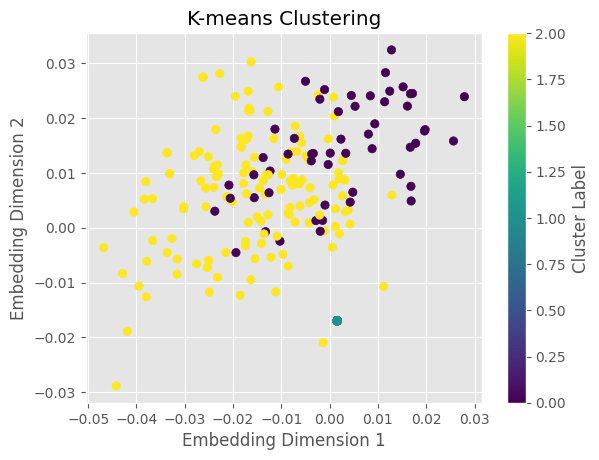

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Perform K-means clustering
n_clusters = 3  # Number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(res)

# Extract the x and y coordinates for the scatter plot
x = [embedding[0] for embedding in res]  # X-axis values
y = [embedding[1] for embedding in res]  # Y-axis values

# Create the scatter plot with cluster colors
plt.scatter(x, y, c=labels, cmap='viridis')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.title('K-means Clustering')
plt.colorbar(label='Cluster Label')
plt.show()

## DATA ANALYSIS

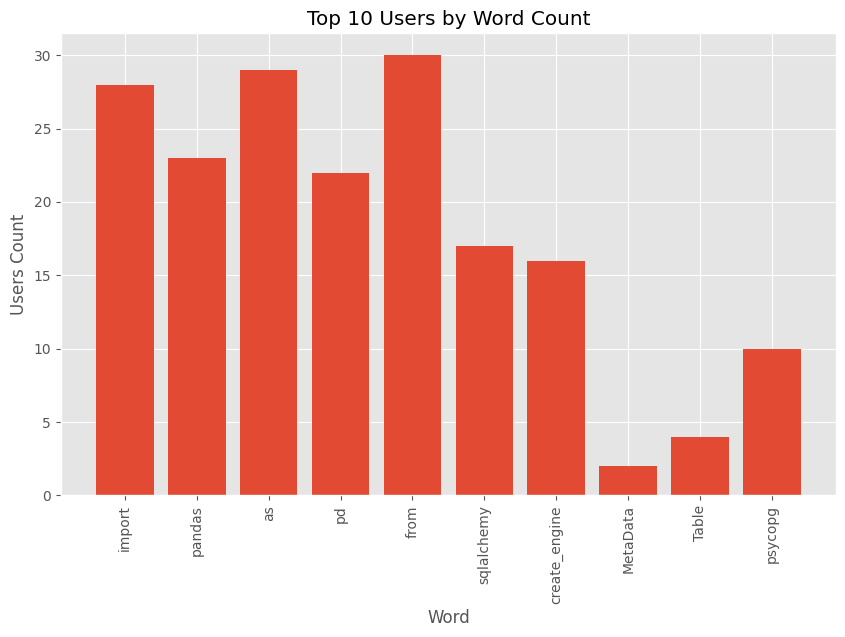

In [ ]:
# Plotting the top 10 users
plt.figure(figsize=(10, 6))
plt.bar(result_df['Word'][:10], result_df['Number of Users'][:10])
plt.xlabel('Word')
plt.ylabel('Users Count')
plt.title('Top 10 Users by Word Count')
plt.xticks(rotation=90)
plt.show()

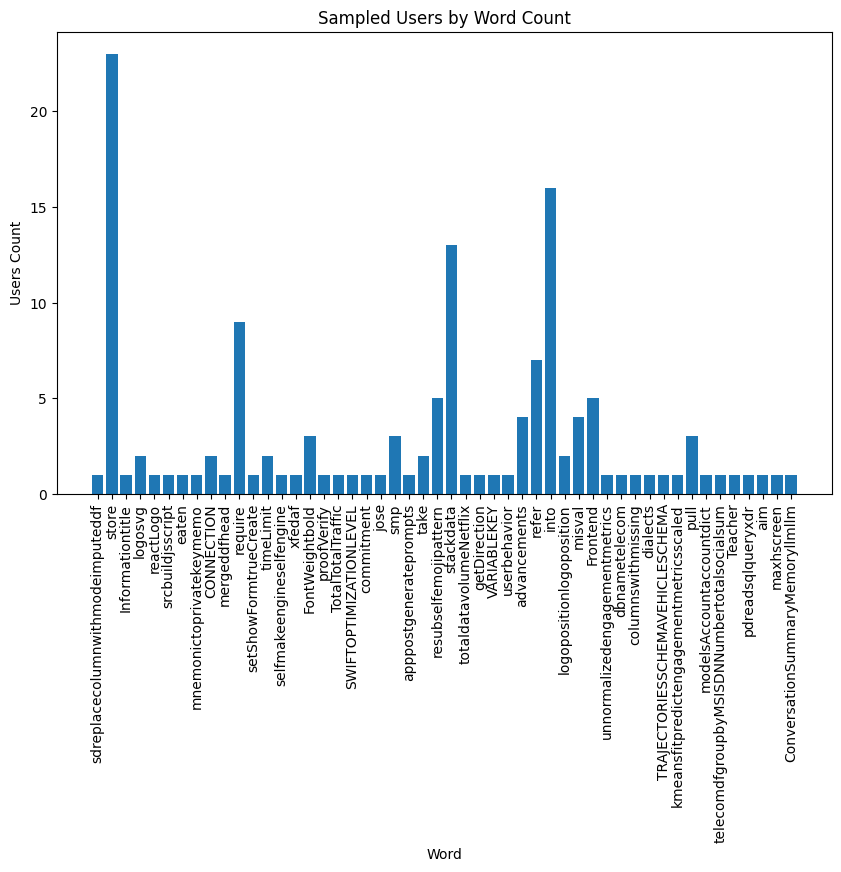

In [ ]:
# Randomly sample 1000 data points
sample_df = result_df.sample(n=50)

plt.figure(figsize=(10, 6))
plt.bar(sample_df['Word'], sample_df['Number of Users'])
plt.xlabel('Word')
plt.ylabel('Users Count')
plt.title('Sampled Users by Word Count')
plt.xticks(rotation=90)
plt.show()

In [ ]:
result_df.groupby('Word')['Number of Users'].sum()

Word
A                                   71
AAA                                  1
ABC                                  2
ABI                                  4
ABIEncoderV                          1
                                    ..
zstandardpyhf                        1
zstdhab                              5
zstdhcb                              1
zstdhdd                              1
ztophandsetspermanufacturerCount     1
Name: Number of Users, Length: 40323, dtype: int64

In [ ]:
def topic_modeling(info):
    df = pd.DataFrame(info)        
    df['name'] = df['Number of Users']
    df['message'] = df['Word']     
  
    # print(df['Tweets'].value_counts( ))
    # print(df['username'].value_counts())
    
    doc = df[['message','name']].rename(columns={'msg_content':'message', 'sender_name': 'name'})
    pd.set_option('display.max_colwidth', None)
    #print(doc)
    X_train, X_hold = train_test_split(doc, test_size=0.6, random_state=111)
     
    def tokenize(text):
        tokens = [word for word in nltk.word_tokenize(text) if (len(word) > 3 and len(word.strip('Xx/')) > 2) ]
        return tokens

    vectorizer_tf = TfidfVectorizer(tokenizer=tokenize, stop_words='english', max_df=0.95, min_df=5, max_features=10000, use_idf=False, norm=None, token_pattern=None)
    tf_vectors = vectorizer_tf.fit_transform(X_train.message)

    lda = decomposition.LatentDirichletAllocation(
        n_components=10, max_iter=3, learning_method='online',
        learning_offset=50, n_jobs=-1, random_state=111
    )
    W1 = lda.fit_transform(tf_vectors)
    H1 = lda.components_
    # print(W1)

    num_words=15
    vocab = np.array(vectorizer_tf.get_feature_names_out())
    top_words = lambda t: [vocab[i] for i in np.argsort(t)[:-num_words-1:-1]]
    topic_words = ([top_words(t) for t in H1])
    topics = [' '.join(t) for t in topic_words]
    print(topics)

    colnames = ["Topic" + str(i) for i in range(lda.n_components)]
    docnames = ["Doc" + str(i) for i in range(len(X_train.message))]
    df_doc_topic = pd.DataFrame(np.round(W1, 2), columns=colnames, index=docnames)
    print(df_doc_topic)
    significant_topic = np.argmax(df_doc_topic.values, axis=1)
    df_doc_topic['dominant_topic'] = significant_topic
 
    #Visualization
    pyLDAvis.enable_notebook()
    vis = pyLDAvis.lda_model.prepare(lda, tf_vectors, vectorizer_tf)
    return pyLDAvis.display(vis) 

In [ ]:
# !pip install pyarrow

In [ ]:
topic_modeling(result_df)

['provided remove endtoend join populate using spaces title make task duration integer enable assume test', 'step download enable variables contents left provided label dataframe start identify string assume spaces optin', 'task identify path download join populate label engine left step test server record display make', 'welcome title null join reset input download string automatically display populate endtoend engine remove integer', 'duration make left server populate data title welcome automatically download avoid academy display join test', 'display engine input test text academy welcome provided interpretation null automatically using remove reset make', 'start avoid label integer left display reset using task remove minimum step record contents download', 'string record optin populate contents start interpretation path null provided avoid test reset enable engine', 'create using automatically dataframe minimum spaces optin welcome enable populate duration data contents reset dow

## ANOTHER TEST

In [ ]:
df = pd.read_csv("./dat.csv")
df = pd.DataFrame(df)

In [ ]:
block_list=[]
for string in df['code_content']:
    #normal_string = re.sub("(http[s]?\://\S+)|([\[\(].*[\)\]])|([#@]\S+)|(#@')|\n", "", string)
    normal_string = re.sub(r"[^\w\s]|[\d]|['\"\(\)\[\]\{\}]|(?:\d{1,2}[./])?(?:\d{1,2}[./])?(?:\d{2,4})?(?:\d{2}:\d{2}(?::\d{2})?)?", "", string)
    block_list.append(normal_string)

df["code_content"] = block_list

In [ ]:
block_list=[]
for string in df['code_content']:
    normal_string = re.sub(r"[\n]", " ", string)
    block_list.append(normal_string)

df["code_content"] = block_list

In [ ]:
from langchain.embeddings.openai import OpenAIEmbeddings

embed_model = OpenAIEmbeddings(model="text-embedding-ada-002")

texts = [
    'this is the first chunk of text',
    'then another second chunk of text is here'
]

X = embed_model.embed_documents(df['code_content'])
len(X), len(X[0])

/home/vboxuser/.local/lib/python3.10/site-packages/langchain_community/embeddings/openai.py:499: PydanticDeprecatedSince20: The `dict` method is deprecated; use `model_dump` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.5/migration/
  response = response.dict()
/home/vboxuser/.local/lib/python3.10/site-packages/pydantic/main.py:979: PydanticDeprecatedSince20: The `dict` method is deprecated; use `model_dump` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.5/migration/
  warnings.warn('The `dict` method is deprecated; use `model_dump` instead.', DeprecationWarning)


(201, 1536)

In [ ]:
# Perform K-means clustering
n_clusters = 5  # Number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(X)
# Add the cluster labels to the DataFrame
df['cluster_label'] = labels

# Create a dictionary to store the word counts per cluster and user
word_counts = {i: {} for i in range(n_clusters)}

# Iterate over the DataFrame rows
for index, row in df.iterrows():
    user_id = row['user_id']
    cluster_label = row['cluster_label']
    code_content = row['code_content']
    
    # Split the code content into words
    words = code_content.split()
    
    # Update the word counts for the cluster and user
    for word in words:
        if word in word_counts[cluster_label]:
            if user_id in word_counts[cluster_label][word]:
                word_counts[cluster_label][word][user_id] += 1
            else:
                word_counts[cluster_label][word][user_id] = 1
        else:
            word_counts[cluster_label][word] = {user_id: 1}

# Print the word counts for each cluster and user
for cluster_label, words in word_counts.items():
    print(f"Cluster {cluster_label}:")
    for word, user_counts in words.items():
        print(f"Word: {word}")
        print(f"Number of Users: {len(user_counts)}")
        print(f"User IDs and Counts: {user_counts}")
        print()

Cluster 0:
Word: End_to_End
Number of Users: 8
User IDs and Counts: {619: 2, 659: 1, 625: 1, 617: 1, 631: 1, 775: 1, 642: 1, 730: 1}

Word: Web
Number of Users: 20
User IDs and Counts: {619: 4, 606: 3, 765: 2, 652: 1, 688: 1, 659: 3, 705: 2, 625: 1, 617: 2, 631: 4, 775: 2, 642: 1, 585: 2, 696: 2, 730: 2, 670: 1, 766: 1, 761: 1, 605: 5, 645: 1}

Word: dApps
Number of Users: 11
User IDs and Counts: {619: 5, 635: 1, 659: 2, 646: 1, 625: 1, 617: 1, 631: 1, 775: 1, 605: 2, 730: 1, 606: 2}

Word: certificate
Number of Users: 22
User IDs and Counts: {619: 4, 606: 11, 604: 9, 765: 7, 750: 2, 652: 4, 688: 5, 659: 2, 705: 11, 682: 9, 646: 1, 625: 1, 617: 2, 631: 2, 775: 9, 642: 8, 585: 2, 696: 10, 690: 3, 605: 34, 730: 2, 670: 4}

Word: generation
Number of Users: 9
User IDs and Counts: {619: 2, 606: 2, 659: 1, 705: 1, 646: 1, 775: 1, 585: 1, 696: 1, 730: 1}

Word: distribution
Number of Users: 9
User IDs and Counts: {619: 5, 606: 3, 688: 1, 659: 1, 705: 1, 775: 1, 696: 1, 605: 1, 730: 1}

Word:

In [ ]:
# Create a list to store the cluster, word, number of users, user IDs, and counts
result_data = []

# Iterate over the word counts for each cluster and user
for cluster_label, words in word_counts.items():
    for word, user_counts in words.items():
        num_users = len(user_counts)
        user_ids_counts = ', '.join([f"{user_id}: {count}" for user_id, count in user_counts.items()])
        
        # Append the data to the list
        result_data.append({'Cluster': cluster_label, 'Word': word, 'Number of Users': num_users, 'User IDs and Counts': user_ids_counts})

# Convert the list of dictionaries to a DataFrame
res_df = pd.DataFrame(result_data)

In [ ]:
import os
def topic_modeling(info):
    df = pd.DataFrame(info)        
    df['name'] = df['Number of Users']
    df['message'] = df['Word']     
  
    # print(df['Tweets'].value_counts( ))
    # print(df['username'].value_counts())
    
    doc = df[['message','name']].rename(columns={'msg_content':'message', 'sender_name': 'name'})
    pd.set_option('display.max_colwidth', None)
    #print(doc)
    X_train, X_hold = train_test_split(doc, test_size=0.6, random_state=111)
     
    def tokenize(text):
        tokens = [word for word in nltk.word_tokenize(text) if (len(word) > 3 and len(word.strip('Xx/')) > 2) ]
        return tokens

    vectorizer_tf = TfidfVectorizer(tokenizer=tokenize, stop_words='english', max_df=0.95, min_df=5, max_features=10000, use_idf=False, norm=None, token_pattern=None)
    tf_vectors = vectorizer_tf.fit_transform(X_train.message)

    lda = decomposition.LatentDirichletAllocation(
        n_components=10, max_iter=3, learning_method='online',
        learning_offset=50, n_jobs=-1, random_state=111
    )
    W1 = lda.fit_transform(tf_vectors)
    H1 = lda.components_
    # print(W1)

    num_words=15
    vocab = np.array(vectorizer_tf.get_feature_names_out())
    top_words = lambda t: [vocab[i] for i in np.argsort(t)[:-num_words-1:-1]]
    topic_words = ([top_words(t) for t in H1])
    topics = [' '.join(t) for t in topic_words]
    print(topics)

    colnames = ["Topic" + str(i) for i in range(lda.n_components)]
    docnames = ["Doc" + str(i) for i in range(len(X_train.message))]
    df_doc_topic = pd.DataFrame(np.round(W1, 2), columns=colnames, index=docnames)
    print(df_doc_topic)
    significant_topic = np.argmax(df_doc_topic.values, axis=1)
    df_doc_topic['dominant_topic'] = significant_topic
 
    #Visualization
    pyLDAvis.enable_notebook()
    vis = pyLDAvis.lda_model.prepare(lda, tf_vectors, vectorizer_tf)
    return pyLDAvis.display(vis)

In [ ]:
topic_modeling(res_df)

NameError: name 'res_df' is not defined